# 1. Primary data analysis

## 1.1 Connecting libraries and importing data


In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from sklearn import preprocessing
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA
%matplotlib inline

In [2]:
def get_count_by_column(dataframe, seach):
    unique, counts = np.unique(np.argwhere(np.isin(dataframe.to_numpy(), seach))[:, 1], return_counts=True)
    print(f"Search {seach} value: ", dict(zip(dataframe.columns[unique], counts)))

def show_cdf_ww_corr():
    corr_cdf_ww = cdf_ww.corr()
    sns.set(font_scale = 0.8)
    figure(figsize = (4, 3), dpi = 120)
    corr_cdf_ww_figure = sns.heatmap(corr_cdf_ww)
    
def show_cdf_wr_corr():
    corr_cdf_wr = cdf_wr.corr()
    sns.set(font_scale = 0.8)
    figure(figsize = (4, 3), dpi = 120)
    corr_cdf_wr_figure = sns.heatmap(corr_cdf_wr)
    
def std_scale(df, column):
    std_scale = preprocessing.StandardScaler().fit(df[[column]])
    df_std = std_scale.transform(df[[column]])
    print(f'Mean after standardization: {column} = {df_std[:,0].mean()}')
    print(f'Standard deviation after standardization: {column} = {df_std[:,0].std()}\n')
    return df_std

def minmax_scale(df, column):
    minmax_scale = preprocessing.MinMaxScaler().fit(df[[column]])
    df_minmax = minmax_scale.transform(df[[column]])
    print(f'Min-value after min-max scaling: {column}={df_minmax[:,0].min()}')
    print(f'Max-value after min-max scaling: {column}={df_minmax[:,0].max()}\n')
    return df_minmax

def plot(df, x, y, df_std_x, df_std_y, df_minmax_x, df_minmax_y, fname):
    plt.figure(figsize=(8,6))
    plt.scatter(df[x], df[y], color = 'green', label = 'input scale', alpha=0.5)
    plt.scatter(df_std_x, df_std_y, color='red', label = 'Standardized [N  (m=0, ; d=1)]', alpha = 0.3)
    plt.scatter(df_minmax_x, df_minmax_y, color = 'blue', label = 'min-max scaled [min=0, max=1]', alpha = 0.3)
    plt.title(f'{x} and {y} content of the wine dataset')
    plt.xlabel(x)
    plt.ylabel(y)
    plt.legend(loc = 'upper left')
    plt.grid()
    plt.tight_layout()
    plt.savefig(fname)
    
def PCA_dimensionality_reduction(df, dimension, columns):
    pca = PCA(n_components = dimension)
    pca.fit(df)
    df_PCA = pca.transform(df)
    df_PCA = pd.DataFrame(df_PCA, columns=columns)
    return df_PCA

In [3]:
df_wr = pd.read_csv('Data Folder/winequality-red.csv', ';')
df_ww = pd.read_csv('Data Folder/winequality-white.csv', ';')

C:\Users\Administrator\AppData\Local\Temp\ipykernel_15012\1562470115.py:1: FutureWarning: In a future version of pandas all arguments of read_csv except for the argument 'filepath_or_buffer' will be keyword-only.
  df_wr = pd.read_csv('Data Folder/winequality-red.csv', ';')
C:\Users\Administrator\AppData\Local\Temp\ipykernel_15012\1562470115.py:2: FutureWarning: In a future version of pandas all arguments of read_csv except for the argument 'filepath_or_buffer' will be keyword-only.
  df_ww = pd.read_csv('Data Folder/winequality-white.csv', ';')


Note that the separator here is not the default "," (comma), but ";" (semicolon)


## 1.2 General information about datasets


In [4]:
df_wr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [5]:
df_ww.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


We see that there are no Non-Null values ​​in both datasets.


In [6]:
display(df_wr)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [7]:
display(df_ww)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


We use the display method instead of head() for a short output, it is more informative and immediately shows the shape of the dataset.


Based on the fact that all columns are numeric, we can conclude that these datasets do not have categorical features. However, we have an ordinal target: quality


In the output of the display method, we see that all values ​​are filled with numbers.


# 2. Преобразование типов и корректировка значений

Find out if there are zero values ​​in df_wr


In [8]:
cdf_ww = df_ww.copy() # cdf - cleared data frame
get_count_by_column(cdf_ww, 0)
get_count_by_column(cdf_ww, np.nan)
get_count_by_column(cdf_ww, None)
get_count_by_column(cdf_ww, [np.inf, -np.inf])

Search 0 value:  {'citric acid': 19}
Search nan value:  {}
Search None value:  {}
Search [inf, -inf] value:  {}


In [9]:
cdf_wr = df_wr.copy() # cdf - cleared data frame
get_count_by_column(cdf_wr, 0)
get_count_by_column(cdf_wr, np.nan)
get_count_by_column(cdf_wr, None)
get_count_by_column(cdf_ww, [np.inf, -np.inf])

Search 0 value:  {'citric acid': 132}
Search nan value:  {}
Search None value:  {}
Search [inf, -inf] value:  {}


132 null instances found in cdf_wr, all in the citric acid column. None or nan values ​​were not found. Zero values ​​are normal data. There is nothing to clean in the cdf_wr dataset.


19 null instances found in cdf_ww, all in the citric acid column. None or nan values ​​were not found. Here, too, there is nothing to clean in the cdf_ww dataset.


# 3. Feature engineering

Let's take a look at the correlation module to try to immediately determine which categories we can combine


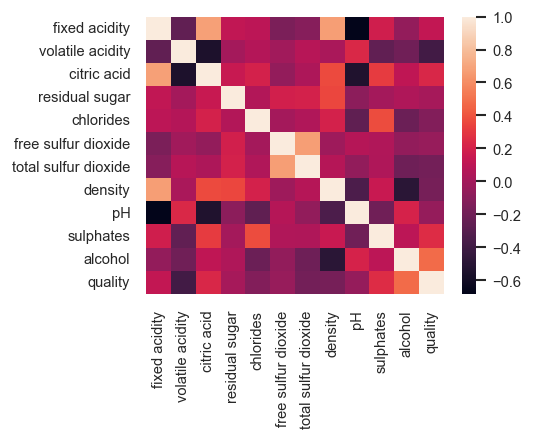

In [10]:
show_cdf_wr_corr()
plt.savefig('cdf_wr_corr.png')

We see that there is no strong correlation, only in some areas it reaches 0.6


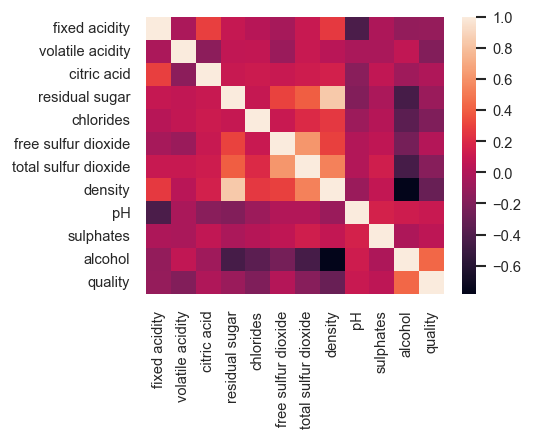

In [11]:
show_cdf_ww_corr()
plt.savefig('cdf_ww_corr.png')

Here the correlation is very weak, but only for two categories the correlation is high (equal to 0.8): for density and residual sugar


Let's try to build paired graphs to see in one picture how different features are related to each other (for cdf_wr). The output will be saved to a file.


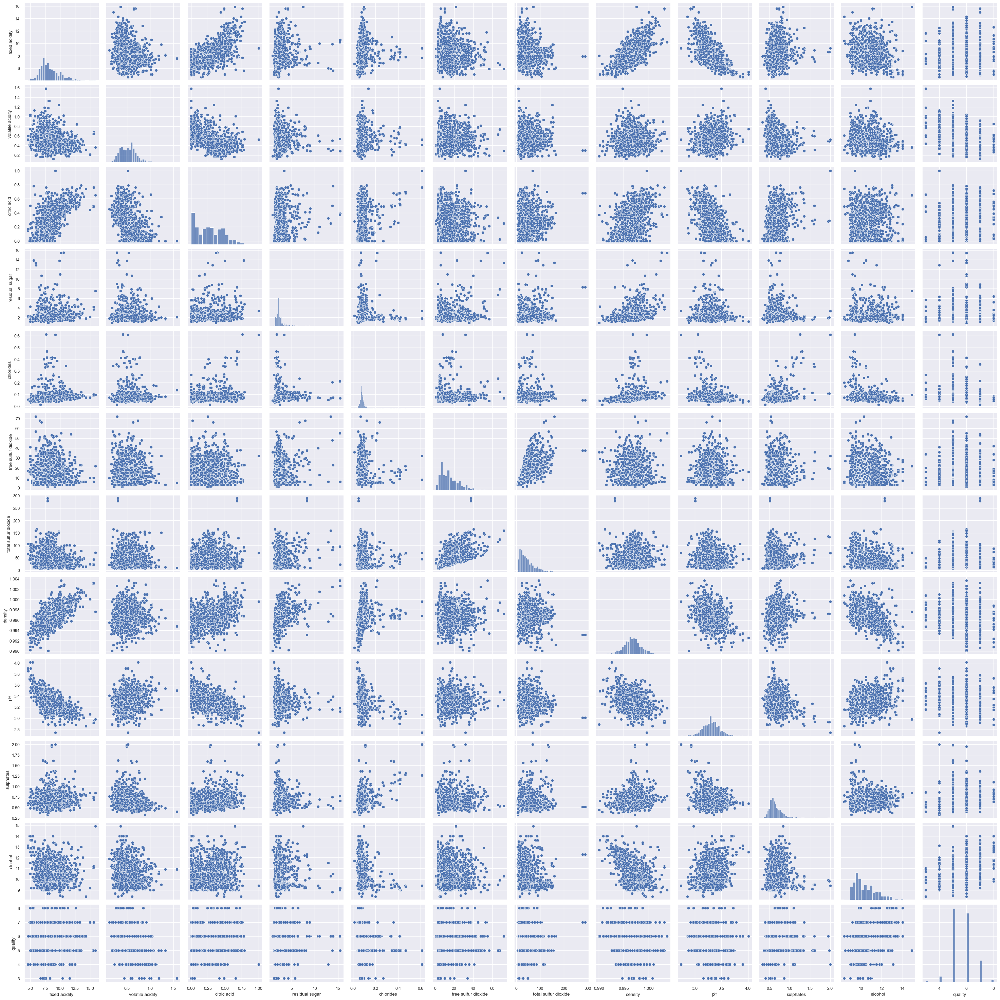

In [12]:
%config InlineBackend.figure_format = 'png'
cdf_ww_pairplot = sns.pairplot(cdf_wr);
cdf_ww_pairplot.fig.savefig("cdf_wr_pairplot.png")

Now let's look at the same chart but for cdf_ww


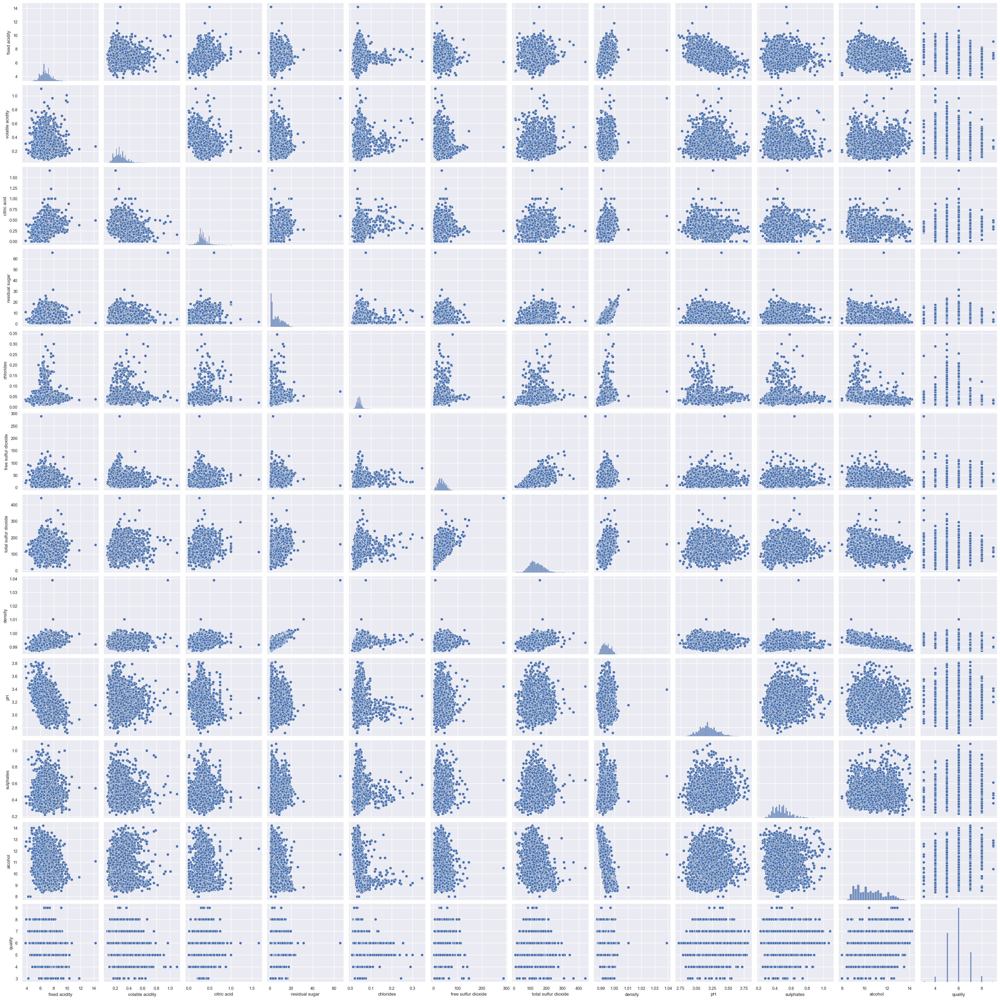

In [13]:
%config InlineBackend.figure_format = 'png' 
cdf_ww_pairplot = sns.pairplot(cdf_ww);
cdf_ww_pairplot.fig.savefig("cdf_ww_pairplot.png")

Let's note some categories that we could unite. Based on the correlation matrix and pair plots for all categories, we can note the following categories: From the cdf_wr dataset: total sulfur dioxide - free sulfur dioxide; fixed acidity-density; From cdf_ww dataset: density - residual sugar;
sugar;

Let's look at how density and residual sugar are related


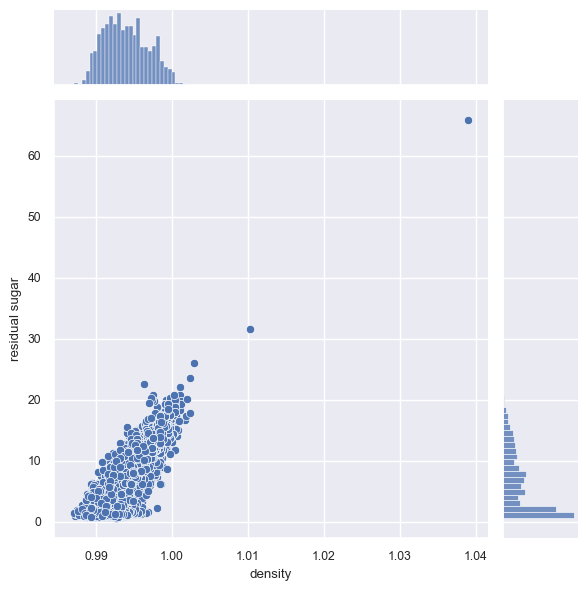

In [14]:
sns.jointplot(x='density', y='residual sugar', data = cdf_ww, kind = 'scatter');

As we can see, they are almost 1:1, since residual sugar mostly fluctuates between 0.99 - 1.00


Let's look at the density distribution. To do this, we will build a distplot


C:\Users\Administrator\AppData\Local\Temp\ipykernel_15012\2423162477.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cdf_ww.density);


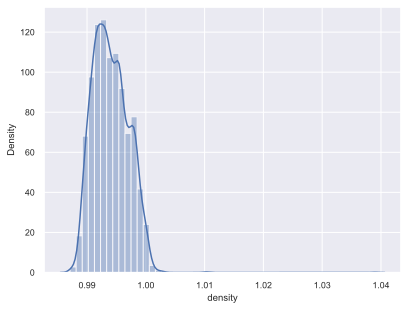

In [15]:
%config InlineBackend.figure_format = 'svg' 
sns.distplot(cdf_ww.density);

Yes, indeed, almost all destiny values ​​​​are in the range of 0.99 - 1.00


For interest, let's plot the density distribution for residual sugar


C:\Users\Administrator\AppData\Local\Temp\ipykernel_15012\2019037869.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cdf_ww['residual sugar']);


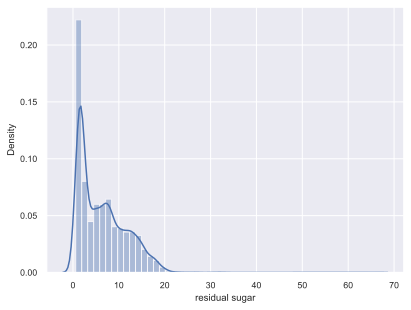

In [16]:
%config InlineBackend.figure_format = 'svg' 
sns.distplot(cdf_ww['residual sugar']);

Here the distribution lies mainly in the range 0 - 20


Let's try to create a new feature based on the density and residual sugar correlated features for the cdf_ww dataset. To do this, we multiply them.


In [17]:
cdf_ww = cdf_ww.assign(density_residual_sugar = cdf_ww['density'] * cdf_ww['residual sugar'])

In [18]:
cdf_ww

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,density_residual_sugar
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,20.720700
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,1.590400
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,6.866190
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,8.462600
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,8.462600
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,1.585824
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,7.959200
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,1.191048
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,1.087559


Feature density_residual_sugar added


Now let's look at the correlation table again


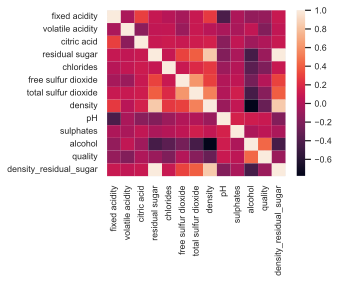

In [19]:
show_cdf_ww_corr()

As we can see, the new feature density_residual_sugar karels with density (value 0.8) and residual sugar (value 1.0). Let's remove these two features so that only the new one remains


In [20]:
cdf_ww = cdf_ww.drop(columns=['density', 'residual sugar'])

In [21]:
cdf_ww

,fixed acidity,volatile acidity,citric acid,chlorides,free sulfur dioxide,total sulfur dioxide,pH,sulphates,alcohol,quality,density_residual_sugar
0,7.0,0.27,0.36,0.045,45.0,170.0,3.00,0.45,8.8,6,20.720700
1,6.3,0.30,0.34,0.049,14.0,132.0,3.30,0.49,9.5,6,1.590400
2,8.1,0.28,0.40,0.050,30.0,97.0,3.26,0.44,10.1,6,6.866190
3,7.2,0.23,0.32,0.058,47.0,186.0,3.19,0.40,9.9,6,8.462600
4,7.2,0.23,0.32,0.058,47.0,186.0,3.19,0.40,9.9,6,8.462600
...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,0.039,24.0,92.0,3.27,0.50,11.2,6,1.585824
4894,6.6,0.32,0.36,0.047,57.0,168.0,3.15,0.46,9.6,5,7.959200
4895,6.5,0.24,0.19,0.041,30.0,111.0,2.99,0.46,9.4,6,1.191048
4896,5.5,0.29,0.30,0.022,20.0,110.0,3.34,0.38,12.8,7,1.087559


Density and residual sugar features have been removed


Let's look again at the correlation matrix


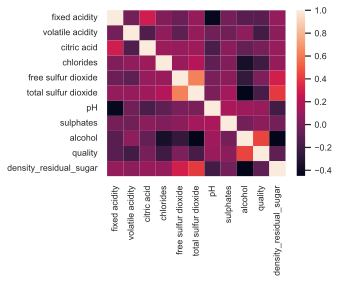

In [22]:
show_cdf_ww_corr()

Add a new feature used_sulfur_dioxide by subtracting free sulfur dioxide from total sulfur dioxide


In [23]:
cdf_ww = cdf_ww.assign(used_sulfur_dioxide = cdf_ww['total sulfur dioxide'] - cdf_ww['free sulfur dioxide'])

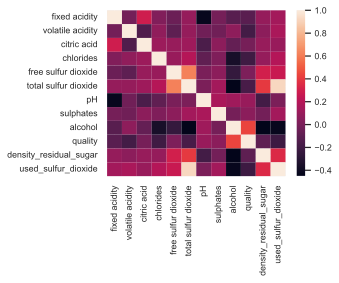

In [24]:
show_cdf_ww_corr()

As we can see, the new feature used_sulfur_dioxide correlates with total sulfur dioxide. Remove the feature total sulfur dioxide


In [25]:
cdf_ww = cdf_ww.drop(columns=['total sulfur dioxide'])

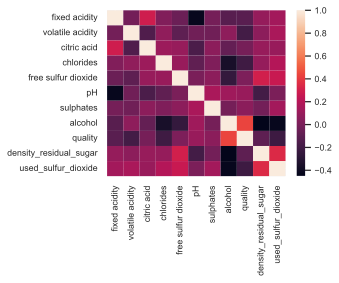

In [26]:
show_cdf_ww_corr()

As you can see, we got rid of the correlation in the cdf_ww dataset greater than or equal to 0.8


Let's create the density_residual_sugar and used_sulfur_dioxide features for the cdf_wr dataset


In [27]:
cdf_wr = cdf_wr.assign(density_residual_sugar = cdf_wr['density'] * cdf_wr['residual sugar'])
cdf_wr = cdf_wr.drop(columns=['density', 'residual sugar'])

In [28]:
cdf_wr = cdf_wr.assign(used_sulfur_dioxide = cdf_wr['total sulfur dioxide'] - cdf_wr['free sulfur dioxide'])
cdf_wr = cdf_wr.drop(columns=['total sulfur dioxide'])

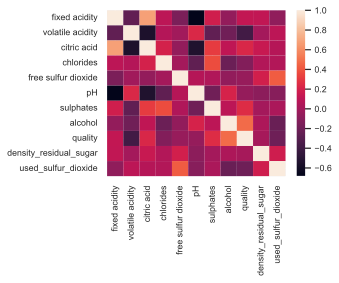

In [29]:
show_cdf_wr_corr()

Let's create another feature for citric acid and fixed acidity columns


Let's take a look at the distribution of values ​​for these columns


C:\Users\Administrator\AppData\Local\Temp\ipykernel_15012\3770482862.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cdf_wr['citric acid']);


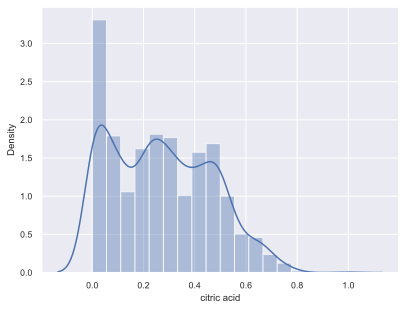

In [30]:
%config InlineBackend.figure_format = 'svg' 
sns.distplot(cdf_wr['citric acid']);

C:\Users\Administrator\AppData\Local\Temp\ipykernel_15012\3691888284.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cdf_wr['fixed acidity']);


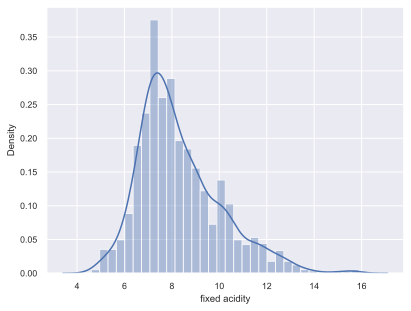

In [31]:
%config InlineBackend.figure_format = 'svg' 
sns.distplot(cdf_wr['fixed acidity']);

We can assume that citric acid is part of fixed acidity, then we should subtract citric acid from fixed acidity and get a new feature


In [32]:
cdf_wr = cdf_wr.assign(not_citric_fixed_acidity = cdf_wr['fixed acidity'] - cdf_wr['citric acid'])
cdf_wr = cdf_wr.drop(columns=['fixed acidity', 'citric acid'])

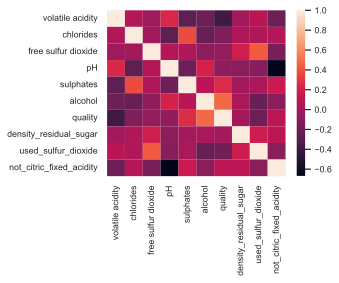

In [33]:
show_cdf_wr_corr()

We have added three new features. Now on the correlation matrix we have no correlation above ~0.6


# 4. Feature scaling


## 4.1 Standardization и Min-Max scaling

### 4.1.1 cdf_ww

Let's scale the cdf_ww dataset for the columns density_residual_sugar and used_sulfur_dioxide


In [34]:
cdf_ww_df_std_density_residual_sugar = std_scale(cdf_ww, 'density_residual_sugar')
cdf_ww_df_std_used_sulfur_dioxide = std_scale(cdf_ww, 'used_sulfur_dioxide')

Mean after standardization: density_residual_sugar = -8.268872180139998e-17
Standard deviation after standardization: density_residual_sugar = 1.0

Mean after standardization: used_sulfur_dioxide = -4.642173855517192e-17
Standard deviation after standardization: used_sulfur_dioxide = 1.0



In [35]:
cdf_ww_minmax_scale_density_residual_sugar = minmax_scale(cdf_ww, 'density_residual_sugar')
cdf_ww_minmax_scale_used_sulfur_dioxide = minmax_scale(cdf_ww, 'used_sulfur_dioxide')

Min-value after min-max scaling: density_residual_sugar=0.0
Max-value after min-max scaling: density_residual_sugar=1.0

Min-value after min-max scaling: used_sulfur_dioxide=0.0
Max-value after min-max scaling: used_sulfur_dioxide=1.0



In [36]:
plot(cdf_ww, 
     'used_sulfur_dioxide', 
     'density_residual_sugar', 
     cdf_ww_df_std_used_sulfur_dioxide, 
     cdf_ww_df_std_density_residual_sugar, 
     cdf_ww_minmax_scale_used_sulfur_dioxide,
     cdf_ww_minmax_scale_density_residual_sugar,
     'cdf_ww_std_minmax.png')
plt.show()

As you can see from the graph, the features were scaled successfully. Green dots - original distribution, red - scaling with StandardScaler, blue - scaling with MinMaxScaler


### 4.1.2 cdf_wr

Let's repeat the same steps for the cdf_wr tadaset


In [37]:
cdf_wr_df_std_density_residual_sugar = std_scale(cdf_wr, 'density_residual_sugar')
cdf_wr_df_std_used_sulfur_dioxide = std_scale(cdf_wr, 'used_sulfur_dioxide')

Mean after standardization: density_residual_sugar = -1.0664806540489309e-16
Standard deviation after standardization: density_residual_sugar = 1.0

Mean after standardization: used_sulfur_dioxide = -8.88733878374109e-17
Standard deviation after standardization: used_sulfur_dioxide = 1.0



In [38]:
cdf_wr_minmax_scale_density_residual_sugar = minmax_scale(cdf_wr, 'density_residual_sugar')
cdf_wr_minmax_scale_used_sulfur_dioxide = minmax_scale(cdf_wr, 'used_sulfur_dioxide')

Min-value after min-max scaling: density_residual_sugar=0.0
Max-value after min-max scaling: density_residual_sugar=1.0

Min-value after min-max scaling: used_sulfur_dioxide=0.0
Max-value after min-max scaling: used_sulfur_dioxide=1.0



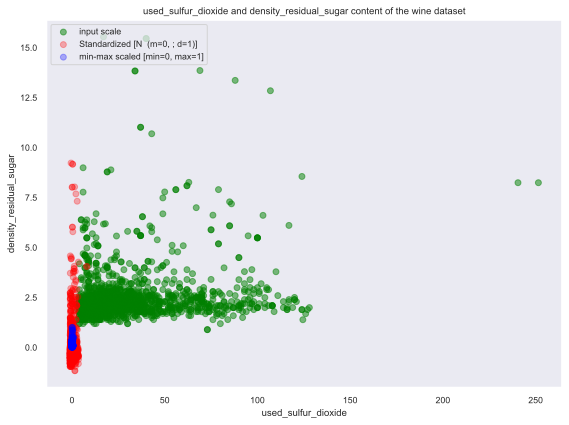

In [39]:
plot(cdf_wr, 
     'used_sulfur_dioxide', 
     'density_residual_sugar', 
     cdf_wr_df_std_used_sulfur_dioxide, 
     cdf_wr_df_std_density_residual_sugar, 
     cdf_wr_minmax_scale_used_sulfur_dioxide,
     cdf_wr_minmax_scale_density_residual_sugar,
     'cdf_wr_std_minmax.png')
plt.show()

### 4.1.3 cdf_wr with two columns

Let's make a check to visually determine whether the graph will change if fit and transorm are performed passing two columns, and not one


Mean after standardization: used_sulfur_dioxide = -8.88733878374109e-17, density_residual_sugar = -1.0664806540489309e-16
Standard deviation after standardization: used_sulfur_dioxide = 1.0, density_residual_sugar = 1.0

Min-value after min-max scaling: used_sulfur_dioxide=0.0, density_residual_sugar=0.0
Max-value after min-max scaling: used_sulfur_dioxide=1.0, density_residual_sugar=1.0



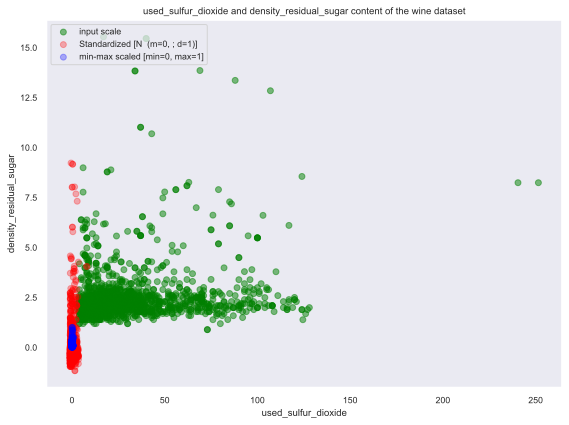

In [40]:
columns = ['used_sulfur_dioxide', 'density_residual_sugar']
f_column, s_column = ['used_sulfur_dioxide', 'density_residual_sugar']

std_scale = preprocessing.StandardScaler().fit(cdf_wr[columns])
df_std = std_scale.transform(cdf_wr[columns])
print(f'Mean after standardization: {f_column} = {df_std[:,0].mean()}, {s_column} = {df_std[:,1].mean()}')
print(f'Standard deviation after standardization: {f_column} = {df_std[:,0].std()}, {s_column} = {df_std[:,1].std()}\n')

minmax_scale = preprocessing.MinMaxScaler().fit(cdf_wr[columns])
df_minmax = minmax_scale.transform(cdf_wr[columns])
print(f'Min-value after min-max scaling: {f_column}={df_minmax[:,0].min()}, {s_column}={df_minmax[:,0].min()}')
print(f'Max-value after min-max scaling: {f_column}={df_minmax[:,0].max()}, {s_column}={df_minmax[:,0].max()}\n')

plt.figure(figsize=(8,6))
plt.scatter(cdf_wr[f_column], cdf_wr[s_column], color = 'green', label = 'input scale', alpha=0.5)
plt.scatter(df_std[:,0], df_std[:,1], color='red', label = 'Standardized [N  (m=0, ; d=1)]', alpha = 0.3)
plt.scatter(df_minmax[:,0], df_minmax[:,1], color = 'blue', label = 'min-max scaled [min=0, max=1]', alpha = 0.3)
plt.title(f'{f_column} and {s_column} content of the wine dataset')
plt.xlabel(f_column)
plt.ylabel(s_column)
plt.legend(loc = 'upper left')
plt.grid()
plt.tight_layout()

plt.savefig('cdf_wr_std_minmax_two_columns.png')

The graph has not changed, the graph (cdf_wr_std_minmax_two_columns.png) is identical to the previous graph for cdf_wr (cdf_wr_std_minmax.png)

# 5. Dividing the dataset into training and test parts


## 5.1 cdf_ww

In [41]:
ww_X, ww_y = cdf_ww.loc[:, cdf_ww.columns != 'quality'], cdf_ww['quality']
ww_X_train, ww_X_test, ww_y_train, ww_y_test = train_test_split(ww_X, ww_y, random_state = 0)
ww_quantile_transformer = preprocessing.QuantileTransformer(random_state = 0)
ww_X_train_trans = ww_quantile_transformer.fit_transform(ww_X_train)
ww_X_test_trans = ww_quantile_transformer.transform(ww_X_test)

In [42]:
np.percentile(ww_X_train['density_residual_sugar'], [0, 25, 50, 75, 100])

array([ 0.59556 ,  1.68742 ,  5.07399 ,  9.741788, 31.92548 ])

In [43]:
np.percentile(ww_X_train_trans[:, 7], [0, 25, 50, 75, 100])

array([0.        , 0.26976977, 0.5045045 , 0.75525526, 1.        ])

In [44]:
np.percentile(ww_X_test['density_residual_sugar'], [0, 25, 50, 75, 100])

array([ 0.791536,  1.688372,  5.271115, 10.13013 , 68.364884])

In [45]:
np.percentile(ww_X_test_trans[:, 7], [0, 25, 50, 75, 100])

array([0.        , 0.26976977, 0.48098098, 0.75525526, 0.99925178])

## 5.2 cdf_wr

In [46]:
wr_X, wr_y = cdf_wr.loc[:, cdf_wr.columns != 'quality'], cdf_wr['quality']
wr_X_train, wr_X_test, wr_y_train, wr_y_test = train_test_split(wr_X, wr_y, random_state = 0)
wr_quantile_transformer = preprocessing.QuantileTransformer(random_state = 0)
wr_X_train_trans = wr_quantile_transformer.fit_transform(wr_X_train)
wr_X_test_trans = wr_quantile_transformer.transform(wr_X_test)

In [47]:
np.percentile(wr_X_train['density_residual_sugar'], [0, 25, 50, 75, 100])

array([ 0.891063,  1.893825,  2.190584,  2.594384, 15.5403  ])

In [48]:
np.percentile(wr_X_train_trans[:, 7], [0, 25, 50, 75, 100])

array([0.        , 0.25275275, 0.4974975 , 0.75125125, 1.        ])

In [49]:
np.percentile(wr_X_test['density_residual_sugar'], [0, 25, 50, 75, 100])

array([ 1.28973 ,  1.892894,  2.194456,  2.59168 , 12.844788])

In [50]:
np.percentile(wr_X_test_trans[:, 7], [0, 25, 50, 75, 100])

array([0.        , 0.22172172, 0.47647648, 0.72472472, 0.99604293])

# 6. Base model training with default hyperparameters


## 6.1 cdf_ww

Ordinary linear least squares regression:


In [51]:
ww_reg = LinearRegression().fit(ww_X_train, ww_y_train)

## 6.2 cdf_wr

Ordinary linear least squares regression:


In [52]:
wr_reg = LinearRegression().fit(wr_X_train, wr_y_train)

# 7. Selection of hyperparameters


## 7.1 cdf_ww

### 7.1.1 Example 1¶


In [53]:
cdf_ww_parameters = {'fit_intercept': [True], 'positive': [False]}
cdf_ww_reg_hyper = LinearRegression()
cdf_ww_clf = GridSearchCV(cdf_ww_reg_hyper, cdf_ww_parameters)
cdf_ww_clf.fit(ww_X_train, ww_y_train)

GridSearchCV(estimator=LinearRegression(),
             param_grid={'fit_intercept': [True], 'positive': [False]})

In [54]:
sorted(cdf_ww_clf.cv_results_.keys())

['mean_fit_time',
 'mean_score_time',
 'mean_test_score',
 'param_fit_intercept',
 'param_positive',
 'params',
 'rank_test_score',
 'split0_test_score',
 'split1_test_score',
 'split2_test_score',
 'split3_test_score',
 'split4_test_score',
 'std_fit_time',
 'std_score_time',
 'std_test_score']

In [55]:
cdf_ww_clf.cv_results_

{'mean_fit_time': array([0.00658255]),
 'std_fit_time': array([0.00149183]),
 'mean_score_time': array([0.00379109]),
 'std_score_time': array([0.00073931]),
 'param_fit_intercept': masked_array(data=[True],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_positive': masked_array(data=[False],
              mask=[False],
        fill_value='?',
             dtype=object),
 'params': [{'fit_intercept': True, 'positive': False}],
 'split0_test_score': array([0.26201418]),
 'split1_test_score': array([0.30527613]),
 'split2_test_score': array([0.2842013]),
 'split3_test_score': array([0.20183697]),
 'split4_test_score': array([0.31367014]),
 'mean_test_score': array([0.27339974]),
 'std_test_score': array([0.04001336]),
 'rank_test_score': array([1])}

The index (of the cv_results_ array) that corresponds to the best setting of the candidate parameter:


In [56]:
cdf_ww_clf.best_index_

0

### 7.1.2 Example 2


Let's try to do the same but with different parameters for this dataset


In [57]:
cdf_ww_parameters_2 = {'fit_intercept': [True, False], 'positive': [True, False]}
cdf_ww_reg_hyper_2 = LinearRegression()
cdf_ww_clf_2 = GridSearchCV(cdf_ww_reg_hyper_2, cdf_ww_parameters_2)
cdf_ww_clf_2.fit(ww_X_train, ww_y_train)

GridSearchCV(estimator=LinearRegression(),
             param_grid={'fit_intercept': [True, False],
                         'positive': [True, False]})

In [58]:
sorted(cdf_ww_clf_2.cv_results_.keys())

['mean_fit_time',
 'mean_score_time',
 'mean_test_score',
 'param_fit_intercept',
 'param_positive',
 'params',
 'rank_test_score',
 'split0_test_score',
 'split1_test_score',
 'split2_test_score',
 'split3_test_score',
 'split4_test_score',
 'std_fit_time',
 'std_score_time',
 'std_test_score']

In [59]:
cdf_ww_clf_2.cv_results_

{'mean_fit_time': array([0.00578299, 0.00518556, 0.00418878, 0.00339069]),
 'std_fit_time': array([0.00039776, 0.00146602, 0.00039887, 0.00048889]),
 'mean_score_time': array([0.00239439, 0.00219421, 0.00199475, 0.00159602]),
 'std_score_time': array([4.88948027e-04, 3.98970263e-04, 3.23406696e-07, 4.88558412e-04]),
 'param_fit_intercept': masked_array(data=[True, True, False, False],
              mask=[False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_positive': masked_array(data=[True, False, True, False],
              mask=[False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'fit_intercept': True, 'positive': True},
  {'fit_intercept': True, 'positive': False},
  {'fit_intercept': False, 'positive': True},
  {'fit_intercept': False, 'positive': False}],
 'split0_test_score': array([0.1994089 , 0.26201418, 0.19834145, 0.25924688]),
 'split1_test_score': array([0.24674831, 0.30527613, 0.25321956, 0.3097

The estimator selected in the search, i.e. the estimator that gave the highest score (or the lowest loss, if specified) for the missing data:


In [60]:
cdf_ww_clf_2.best_estimator_

LinearRegression()

Average cross-validated best_estimator score:


In [61]:
cdf_ww_clf_2.best_score_

0.2733997448250468

This value can be found in the output of cdf_ww_clf_2.cv_results_ above in the 'mean_test_score' parameter. It is also present in the output of cdf_ww_clf.cv_results_ above because tuning with these parameters gave the best results (we will see confirmation of this below in the output of cdf_ww_clf_2.best_params_)


Parameter setting that gave the best results for hold data:


In [62]:
cdf_ww_clf_2.best_params_

{'fit_intercept': True, 'positive': False}

The index (of the cv_results_ dictionary) that corresponds to the best setting of the candidate parameter:


In [63]:
cdf_ww_clf_2.best_index_

1

# 7.2 cdf_wr

In [64]:
cdf_wr_parameters = {'fit_intercept': [True, False], 'positive': [True, False]}
cdf_wr_reg_hyper = LinearRegression()
cdf_wr_clf = GridSearchCV(cdf_wr_reg_hyper, cdf_wr_parameters)
cdf_wr_clf.fit(wr_X_train, wr_y_train)

GridSearchCV(estimator=LinearRegression(),
             param_grid={'fit_intercept': [True, False],
                         'positive': [True, False]})

In [65]:
cdf_wr_clf.cv_results_

{'mean_fit_time': array([0.00458741, 0.00478802, 0.00418949, 0.00339103]),
 'std_fit_time': array([0.00240947, 0.00074702, 0.0003984 , 0.00079823]),
 'mean_score_time': array([0.00179515, 0.00259185, 0.00279169, 0.00179505]),
 'std_score_time': array([0.00074612, 0.00049076, 0.00039795, 0.00074642]),
 'param_fit_intercept': masked_array(data=[True, True, False, False],
              mask=[False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_positive': masked_array(data=[True, False, True, False],
              mask=[False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'fit_intercept': True, 'positive': True},
  {'fit_intercept': True, 'positive': False},
  {'fit_intercept': False, 'positive': True},
  {'fit_intercept': False, 'positive': False}],
 'split0_test_score': array([0.16656588, 0.18862948, 0.15799491, 0.18373653]),
 'split1_test_score': array([0.26473958, 0.36315066, 0.26237595, 0.34925526]),
 'split2

The estimator selected in the search, i.e. the estimator that gave the highest score (or the lowest loss, if specified) for the missing data:


In [66]:
cdf_wr_clf.best_estimator_

LinearRegression()

Average cross-validated best_estimator score:


In [67]:
cdf_wr_clf.best_score_

0.3324397106047772

This value can be found in the output of cdf_wr_clf.cv_results_ above in the 'mean_test_score' parameter


Parameter setting that gave the best results for hold data:


In [68]:
cdf_wr_clf.best_params_

{'fit_intercept': True, 'positive': False}

The index (of the cv_results_ dictionary) that corresponds to the best setting of the candidate parameter:


In [69]:
cdf_wr_clf.best_index_

1

# 8. Evaluation of results

## 8.1 cdf_ww

Forecast determination coefficient:


In [70]:
ww_reg.score(ww_X_test, ww_y_test)

0.24268823024994424

Estimated coefficients for the linear regression problem:


In [71]:
ww_reg.coef_

array([-3.74018040e-02, -1.87747202e+00, -5.57570596e-02, -1.27433542e+00,
        4.86243189e-03,  2.16282432e-01,  3.59271044e-01,  3.60398917e-01,
        2.57195700e-02, -1.07356951e-03])

Independent term in the linear model:


In [72]:
ww_reg.intercept_

1.8715924447863683

Get parameters for this estimator:


In [73]:
ww_reg.get_params()

{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}

Note that the values ​​of fit_intercept and positive are the same as those that were chosen best in the selection of hyperparameters for this model (Section 7.1.2)


Predict using a linear model:


In [74]:
ww_reg.predict(ww_X_test)

array([5.53068518, 5.48336183, 6.02276282, ..., 6.38146202, 5.95175131,
       4.77548612])

Let's compare some predicted numbers with the actual data:


In [75]:
ww_y_test

2762    5
42      6
1419    7
3664    8
2125    5
       ..
36      5
3237    7
4324    6
3411    6
2531    4
Name: quality, Length: 1225, dtype: int64

Indeed, almost all numbers (the first and last five numbers) are the same


Verify that the indices were correctly observed in ww_X_test for prediction:


In [76]:
ww_X_test

,fixed acidity,volatile acidity,citric acid,chlorides,free sulfur dioxide,pH,sulphates,alcohol,density_residual_sugar,used_sulfur_dioxide
2762,7.3,0.32,0.35,0.050,8.0,3.24,0.42,10.7,1.389416,155.0
42,7.0,0.31,0.26,0.069,28.0,3.13,0.46,9.8,7.365960,132.0
1419,7.6,0.14,0.74,0.040,27.0,3.07,0.40,10.8,1.586560,76.0
3664,5.0,0.29,0.54,0.035,54.0,3.27,0.34,12.9,5.641632,101.0
2125,6.0,0.28,0.22,0.048,42.0,3.20,0.46,10.1,12.097755,121.0
...,...,...,...,...,...,...,...,...,...,...
36,6.5,0.39,0.23,0.051,25.0,3.24,0.35,10.0,5.364360,124.0
3237,6.4,0.23,0.35,0.039,43.0,3.18,0.40,11.0,4.563936,104.0
4324,5.9,0.20,0.28,0.043,45.0,3.40,0.41,11.4,0.990330,55.0
3411,6.0,0.14,0.17,0.036,37.0,3.05,0.57,9.8,5.564888,90.0


The indexes for the first and last five rows are the same


## 8.2 cdf_wr

Forecast determination coefficient:


In [77]:
wr_reg.score(wr_X_test, wr_y_test)

0.3437940495829339

Estimated coefficients for the linear regression problem:


In [78]:
wr_reg.coef_

array([-1.15611633e+00, -1.99888987e+00,  7.56704255e-05, -4.70624117e-01,
        8.22563425e-01,  2.80921648e-01,  1.33190865e-02, -3.14382834e-03,
       -4.31993308e-03])

Independent term in the linear model:


In [79]:
wr_reg.intercept_

4.619733650098593

Get parameters for this estimator:


In [80]:
wr_reg.get_params()

{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}

Note that the values ​​of fit_intercept and positive are the same as those that were chosen best in the selection of hyperparameters for this model (section 7.2)


Predict using a linear model:


In [81]:
wr_reg.predict(wr_X_test)

array([5.76432819, 5.0249541 , 6.54828808, 5.38441909, 5.8751092 ,
       5.04958392, 5.393235  , 6.01357956, 4.8138896 , 4.97162781,
       5.33296967, 5.45775282, 5.74383947, 5.09970571, 5.54503361,
       6.38321925, 6.77599618, 5.81296197, 5.92933432, 5.06956319,
       6.27257176, 5.1978698 , 5.60939164, 6.07905811, 5.5391809 ,
       5.01995323, 5.17438364, 6.50897592, 5.34051174, 6.19360438,
       6.07205482, 5.88590371, 5.54722251, 5.29606302, 5.74426143,
       6.2331068 , 5.19373036, 5.44203323, 6.34589814, 5.76279063,
       5.4772545 , 6.02438738, 6.6654166 , 6.53743899, 6.00891977,
       4.81392128, 5.50496572, 6.01989887, 5.51750991, 6.10958996,
       5.35964685, 5.37721997, 5.78205894, 6.35534886, 5.73009127,
       5.20190447, 5.08045725, 5.29848477, 6.47424043, 5.43996708,
       5.15458367, 5.7679005 , 6.06053456, 6.31535302, 5.06424295,
       6.0909642 , 5.36918945, 5.98757801, 6.10349213, 6.06878521,
       5.32214316, 5.48095815, 5.05979724, 5.58365987, 5.65593

Let's compare some predicted numbers with the actual data:


In [82]:
wr_y_test

1109    6
1032    5
1002    7
487     6
979     5
       ..
489     6
362     5
526     5
442     7
1229    5
Name: quality, Length: 400, dtype: int64

Indeed, almost all numbers (the first and last five numbers) are approximately the same


Verify that the indices were correctly respected in wr_X_test for prediction:


In [83]:
wr_X_test

,volatile acidity,chlorides,free sulfur dioxide,pH,sulphates,alcohol,density_residual_sugar,used_sulfur_dioxide,not_citric_fixed_acidity
1109,0.470,0.171,27.0,3.17,0.76,10.8,2.096220,39.0,10.37
1032,0.820,0.095,5.0,3.36,0.53,9.6,4.094014,9.0,8.10
1002,0.290,0.063,13.0,3.26,0.84,11.7,2.040078,14.0,8.77
487,0.645,0.053,5.0,3.17,0.42,10.0,1.796760,9.0,9.84
979,0.450,0.075,3.0,3.13,0.63,10.4,1.395660,3.0,11.71
...,...,...,...,...,...,...,...,...,...
489,0.390,0.073,10.0,3.34,0.75,10.2,2.595840,16.0,8.90
362,0.580,0.072,6.0,3.05,0.56,10.0,2.498000,31.0,11.24
526,0.365,0.088,39.0,3.36,0.78,11.0,2.491500,67.0,6.81
442,0.685,0.100,6.0,2.95,0.68,11.2,3.711840,37.0,14.84


The indexes for the first and last five rows are the same


# 9. Dimensionality Reduction and Linear Regression Plotting


## 9.1 cdf_ww

### 9.1.1 2D graph


Let's transform all the features of the ww_X_train training dataset into one column


In [84]:
ww_X_train_PCA = PCA_dimensionality_reduction(ww_X_train, 1, ['PC1'])
ww_X_train_PCA

,PC1
0,-9.955809
1,-13.346859
2,-68.516236
3,27.417184
4,-12.186828
...,...
3668,-11.676044
3669,86.270055
3670,38.583711
3671,52.997202


Let's convert all the features of the dataset for the ww_X_train test into one column


In [85]:
ww_X_test_PCA = PCA_dimensionality_reduction(ww_X_test, 1, ['PC1'])
ww_X_test_PCA

,PC1
0,46.660677
1,27.780176
2,-27.789293
3,1.605442
4,19.593926
...,...
1220,19.289659
1221,2.645716
1222,-45.404689
1223,-12.088763


Ordinary least squares linear regression based on the received ww_X_train_PCA and ww_y_train:


In [86]:
plot_ww_reg = LinearRegression().fit(ww_X_train_PCA, ww_y_train)

Forecast determination coefficient


In [87]:
plot_ww_reg.score(ww_X_test_PCA, ww_y_test)

0.03037087792071902

Note that the forecast determination coefficient is close to zero


Estimated coefficients for the linear regression problem:


In [88]:
plot_ww_reg_coef_ = plot_ww_reg.coef_
plot_ww_reg_coef_

array([-0.00551611])

Independent term in the linear model:


In [89]:
plot_ww_reg_intercept_ = plot_ww_reg.intercept_
plot_ww_reg_intercept_

5.895725564933297

Get parameters for this estimator:


In [90]:
plot_ww_reg.get_params()

{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}

Predict using a linear model:


In [91]:
plot_ww_reg.predict(ww_X_test_PCA)

array([5.63834031, 5.74248716, 6.04901426, ..., 6.14618266, 5.96240846,
       5.55525264])

Let's build a linear regression plot for the training data:


TODO: wrap in a function


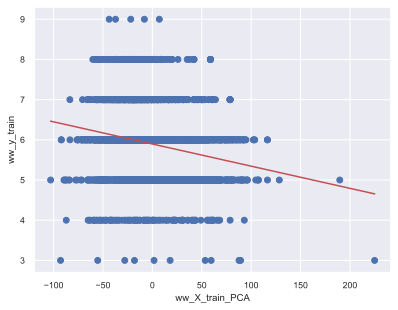

In [92]:
plt.scatter(ww_X_train_PCA['PC1'], ww_y_train)
ww_X_train_PCA_x = ww_X_train_PCA['PC1']
ww_X_train_PCA_y = (plot_ww_reg_coef_ * ww_X_train_PCA['PC1']) + plot_ww_reg_intercept_
plt.plot(ww_X_train_PCA_x, ww_X_train_PCA_y, 'r')
plt.xlabel('ww_X_train_PCA')
plt.ylabel('ww_y_train')
plt.show()

Let's build a linear regression graph for the test data:


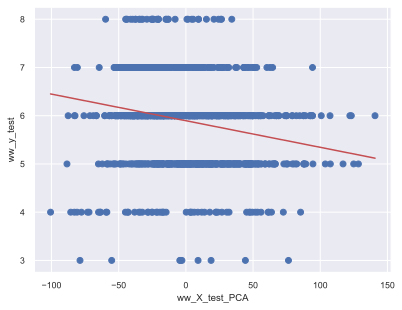

In [93]:
plt.scatter(ww_X_test_PCA['PC1'], ww_y_test)
ww_X_test_PCA_x = ww_X_test_PCA['PC1']
ww_X_test_PCA_y = (plot_ww_reg_coef_ * ww_X_test_PCA['PC1']) + plot_ww_reg_intercept_
plt.plot(ww_X_test_PCA_x, ww_X_test_PCA_y, 'r')
plt.xlabel('ww_X_test_PCA')
plt.ylabel('ww_y_test')
plt.show()

### 9.1.2 3D graph


Let's transform all the features of the ww_X_train training dataset into two columns


In [94]:
ww_X_train_PCA_3d = PCA_dimensionality_reduction(ww_X_train, 2, ['PC1', 'PC2'])
ww_X_train_PCA_3d

,PC1,PC2
0,-9.955809,3.974335
1,-13.346859,1.540161
2,-68.516236,-13.572727
3,27.417184,17.246710
4,-12.186828,2.386095
...,...,...
3668,-11.676044,-8.381365
3669,86.270055,10.223797
3670,38.583711,-4.818453
3671,52.997202,3.102038


Let's transform all the features of the dataset for the ww_X_train test into two columns


In [95]:
ww_X_test_PCA_3d = PCA_dimensionality_reduction(ww_X_test, 2, ['PC1', 'PC2'])
ww_X_test_PCA_3d

,PC1,PC2
0,46.660677,-36.303838
1,27.780176,-12.276462
2,-27.789293,-3.838115
3,1.605442,18.571005
4,19.593926,3.681369
...,...,...
1220,19.289659,-13.945096
1221,2.645716,7.181538
1222,-45.404689,17.486582
1223,-12.088763,3.797125


Ordinary least squares linear regression based on the received ww_X_train_PCA and ww_y_train:


In [96]:
plot_ww_reg_3d = LinearRegression().fit(ww_X_train_PCA_3d, ww_y_train)

Forecast determination coefficient


In [97]:
plot_ww_reg_3d.score(ww_X_test_PCA_3d, ww_y_test)

0.02579297702445349

Note that the forecast determination coefficient is close to zero


Estimated coefficients for the linear regression problem:


In [98]:
plot_ww_reg_coef_3d = plot_ww_reg.coef_
plot_ww_reg_coef_3d

array([-0.00551611])

Independent term in the linear model:


In [99]:
plot_ww_reg_intercept_3d = plot_ww_reg.intercept_
plot_ww_reg_intercept_3d

5.895725564933297

Get parameters for this estimator:


In [100]:
plot_ww_reg_3d.get_params()

{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}

Predict using a linear model:


In [101]:
plot_ww_reg_3d.predict(ww_X_test_PCA_3d)

array([5.43491576, 5.67369736, 6.02750781, ..., 6.24416679, 5.98368523,
       5.33909631])

Let's build a linear regression plot for the training data:


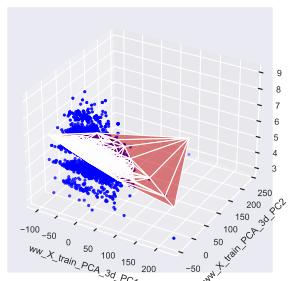

In [102]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(ww_X_train_PCA_3d['PC1'], ww_X_train_PCA_3d['PC2'], ww_y_train, marker = '.', color = 'blue')
ax.set_xlabel("ww_X_train_PCA_3d_PC1")
ax.set_ylabel("ww_X_train_PCA_3d_PC2")
ax.set_zlabel("ww_y_train")
ww_X_train_PCA_3d_x = ww_X_train_PCA_3d['PC1']
ww_X_train_PCA_3d_y = ww_X_train_PCA_3d['PC2']
ww_X_train_PCA_3d_z = (plot_ww_reg_coef_3d * ww_X_train_PCA_3d['PC1']) + (plot_ww_reg_coef_3d * ww_X_train_PCA_3d['PC2']) + plot_ww_reg_intercept_3d
ax.plot_trisurf(ww_X_train_PCA_3d_x, ww_X_train_PCA_3d_y, ww_X_train_PCA_3d_z, color='red', alpha = 0.5)
plt.show()

TODO: plot an interactive 3D linear regression plot
